1. [Открытие данных](#start)
2. [Предобработка данных](#preprocessing)
3. [Создание дополнительных столбцов](#new)
4. [Категории заведений](#cor_1)  
5. [Посадочные места по категориям заведений](#cor_2)
6. [Соотношение сетевых и несетевых заведений](#set)
7. [Анализ сетевых заведений](#set_1)
8. [Топ-15 популярных сетей в Москве](#top_15)
9. [Административные районы Москвы](#distr)
10. [Распределение средних рейтингов по категориям заведений](#rating)
11. [Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района](#hor)
12. [Все заведения на карте](#map)
13. [Топ-15 улиц по количеству заведений](#top_15_street)
14. [Улицы, на которых находится только один объект общепита](#1_street)
15. [Фоновая картограмма (хороплет) со средними чеками заведений](#avg)
16. [Общий вывод](#done)
17. [Вывод](#done_1)
18. [Исследование по открытию кофейни](#coffe)
19. [Круглосуточные кофейни](#24_7)
20. [Рейтинги кофеен](#rat)
21. [Стоимость чашки капучино](#cup)
22. [Рекомендации по открытию кофейни](#rec)
23. [Презентация](#prez)
24. [Общий вывод](#done)

## Открытие данных <a id="start"></a> 

In [1]:
# импорт библиотек
import pandas as pd
import numpy as np
import seaborn as sns
import math as mth
import plotly.express as px
import datetime as dt
import json
import folium

from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from matplotlib import pyplot as plt
from datetime import datetime, timedelta
from scipy import stats as st
from plotly import graph_objects as go

In [2]:
try:
    moscow_places = pd.read_csv('/datasets/moscow_places.csvv')      
except:
    moscow_places = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

In [3]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

## Предобработка данных <a id="preprocessing"></a> 

In [4]:
# функция для предобработки данных
def data_preprocessing(data):
    # приведение наименования столбцов датафрейма к правильному виду
    data.columns = [x.lower().replace(' ', '_') for x in data.columns]
    print('Вывод датафрейма на экран')  
    display(data.head(10))
    print(' ')   
    print('Вывод основной информации о датафрейме с помощью метода info()') 
    display(data.info())
    print(' ') 
    print('Числовое описание данных')
    display(data.describe())
    print(' ')   
    print('Вывод количества пропущенных значений для каждого столбца датафрейма')
    display(data.isna().sum())
    print(' ')   
    print('Проверка количества пропусков в процентах')
    display(pd.DataFrame(round(data.isna().mean()*100,)).style.background_gradient('coolwarm'))
    print(' ')   
    print('Подсчёт количества явных дубликатов')
    display(data.duplicated().sum())

In [5]:
data_preprocessing(moscow_places)

Вывод датафрейма на экран


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


 
Вывод основной информации о датафрейме с помощью метода info()
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+

None

 
Числовое описание данных


,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


 
Вывод количества пропущенных значений для каждого столбца датафрейма


name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

 
Проверка количества пропусков в процентах


,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,61.000000
avg_bill,55.000000


 
Подсчёт количества явных дубликатов


0

In [6]:
# приведение строк к нижнему регистру
moscow_places['name'] = moscow_places['name'].str.lower()
moscow_places['address'] = moscow_places['address'].str.lower()
moscow_places['avg_bill'] = moscow_places['avg_bill'].str.lower()
moscow_places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [7]:
# подсчет количества заведений
print('Количество уникальных заведений:', moscow_places['name'].nunique())

Количество уникальных заведений: 5512


In [8]:
# замена значений 0 - несетевое заведение, 1 - сетевое заведение на соответствующие значения для удобства  
# создание функции для замены значений
def name_place(moscow_places):
    if moscow_places['chain'] == 0:
        return 'несетевое'
    else:
        return 'сетевое'

moscow_places['chain'] = moscow_places.apply(name_place, axis=1)
moscow_places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,несетевое,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,несетевое,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,несетевое,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,несетевое,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,сетевое,148.0


In [9]:
# замена типа данных для столбца chain, поскольку проведена замена значений
moscow_places['chain'] = moscow_places['chain'].astype(object)

**Вывод**   
В датасете представлено 5512 уникальных заведений.  
Заменили значения 0 и 1 в столбце отношения к сетевым заведениям для удобства исследования.  
Типы данных в столбцах в датасете верны. Однако при замене значений столбца chain появилась необходимость замены типа на object.

In [10]:
# подсчет количества заведений и адресов (неявных дубликатов)
print('До удаления неявных дубликатов:', moscow_places.duplicated(subset=['name', 'address']).count())

До удаления неявных дубликатов: 8406


In [11]:
# удаление неявных дубликатов
moscow_places = moscow_places.drop_duplicates(subset=['name', 'address'])
print('После удаления неявных дубликатов:', moscow_places.duplicated(subset=['name', 'address']).count())

После удаления неявных дубликатов: 8402


C:\Users\catya\AppData\Local\Temp\ipykernel_11668\2544395368.py:7: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.stripplot(data=moscow_places, x='category', y='seats', order=grouped.index, palette="Set2")


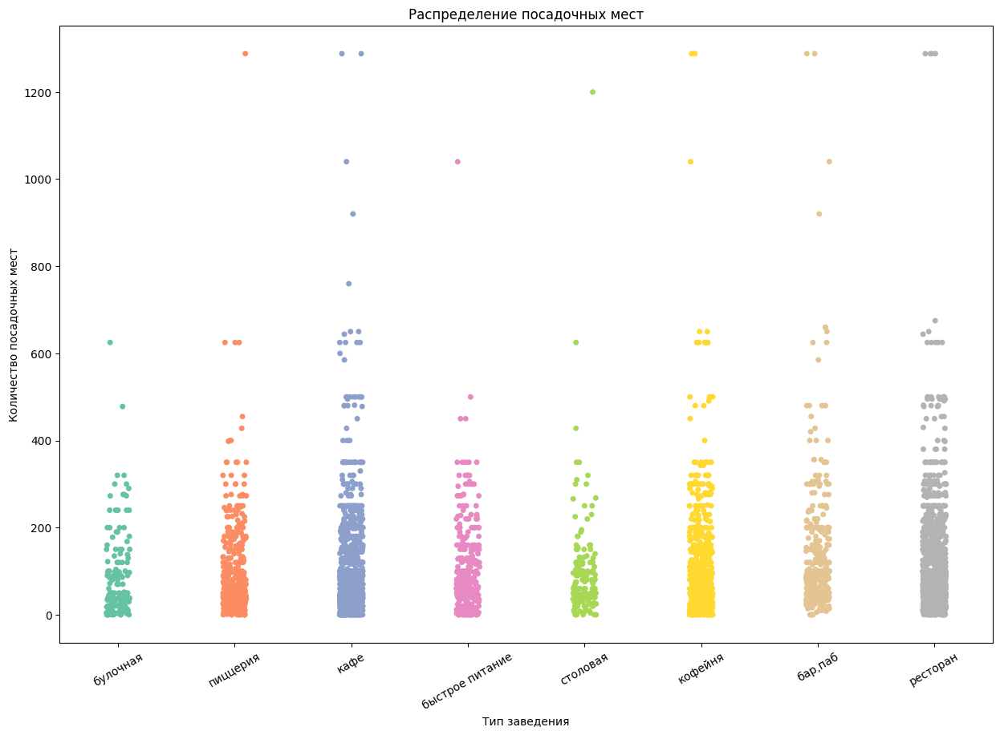

In [12]:
# исследование посадочных мест, поскольку максимальное количество сидячих мест - 1288 (выбросы)
plt.figure(figsize=(15, 10))
grouped = moscow_places.loc[:,['category', 'seats']] \
    .groupby(['category']) \
    .median() \
    .sort_values(by='seats')
sns.stripplot(data=moscow_places, x='category', y='seats', order=grouped.index, palette="Set2")
sns.set_palette('deep') 
plt.title('Распределение посадочных мест')
plt.xlabel('Тип заведения')
plt.ylabel('Количество посадочных мест')
plt.xticks(rotation=30)
plt.show()

In [13]:
# подсчет количества заведений с числом посадочных мест более 400
seats_big = moscow_places[moscow_places['seats'] > 400]['name'].count()
print('Количество заведений с числом посадочных мест больше 400:', seats_big)

seats_share = seats_big / moscow_places['name'].count() * 100
print(f'Доля заведений, в которых число посадочных мест превышает 400: {round((seats_share), 2)}%')

Количество заведений с числом посадочных мест больше 400: 121
Доля заведений, в которых число посадочных мест превышает 400: 1.44%


In [14]:
# отсечение выбросов более 400 посадочных мест, поскольку доля составляет 1.44%
moscow_places_400 = moscow_places[moscow_places['seats'] > 400]
moscow_places = moscow_places.query('index not in @moscow_places_400.index')

In [15]:
# проверка количества пропусков в процентах после всех манипуляций
display(pd.DataFrame(round(moscow_places.isna().mean()*100,)).style.background_gradient('coolwarm'))

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,61.000000
avg_bill,55.000000


**Вывод**   
Неявные дубликаты были удалены, явных дубликатов в датасете не было.  
В датасете большое количество пропусков в столбцах, следовательно, удалить их просто нельзя, а также значения в столбцах middle_coffee_cup и middle_avg_bill заполнены по необходимым условиям:  
* middle_coffee_cup - 94%;  
* middle_avg_bill - 63%;  
* price - 61%;  
* avg_bill - 55%;  
* seats - 43%;  
* hours - 6%.   
  
В данных "количество посадочных мест" были определены и отсечены выбросы. За выбросы принято количество посадочных мест более 400, что составляет 1.44%.

### Создание дополнительных столбцов <a id="new"></a> 

In [16]:
# создание столбца 'street' с названиями улиц
moscow_places['street'] = moscow_places['address'].str.split(', ').str[1]
moscow_places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,несетевое,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,несетевое,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,несетевое,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,несетевое,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,сетевое,148.0,правобережная улица


In [17]:
# создание столбца 'is_24/7' с обозначением, что заведение работает ежедневно и круглосуточно
moscow_places['is_24/7'] = moscow_places['hours'].str.contains('ежедневно, круглосуточно')
moscow_places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,несетевое,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,несетевое,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,несетевое,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,несетевое,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,сетевое,148.0,правобережная улица,False


**Вывод**   
Предобработка данных проведена.  
Новые столбцы добавлены для дальнейшего исследования.

## Категории заведений <a id="cor_1"></a> 

In [18]:
category_places_name = moscow_places.groupby('category')['name'].count().sort_values(ascending = False).reset_index()
category_places_name.columns = ['category', 'count']
display(category_places_name)

,category,count
0,кафе,2346
1,ресторан,2003
2,кофейня,1394
3,"бар,паб",746
4,пиццерия,627
5,быстрое питание,599
6,столовая,312
7,булочная,254


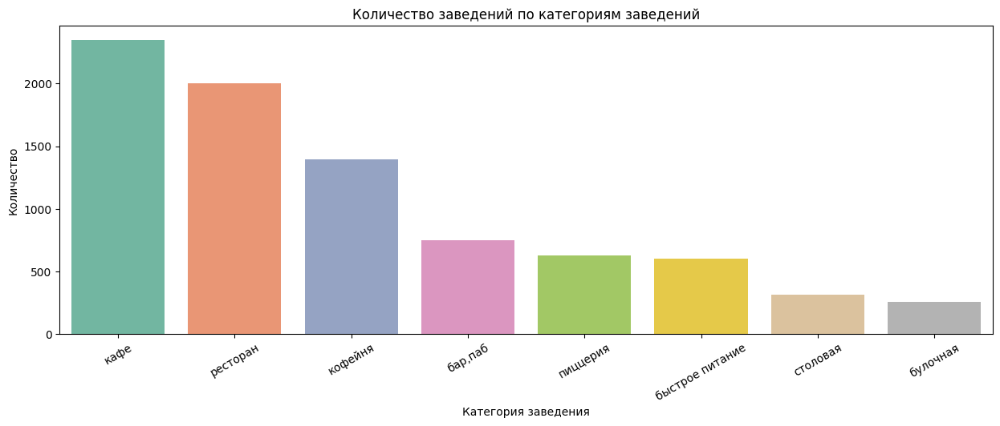

In [19]:
plt.subplots(figsize=(15, 5))
sns.barplot(x='category', y='count', data=category_places_name, palette="Set2") 
plt.title('Количество заведений по категориям заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Количество')
plt.xticks(rotation=30)
plt.show()

**Вывод**   
Можно сделать вывод, что по количеству заведений лидирующую позицию занимают кафе (2346 заведения). На втором месте располагаются рестораны, наименьшую долю составляют булочные (254 заведения).

## Посадочные места по категориям заведений <a id="cor_2"></a> 

In [20]:
category_places_seats = moscow_places.groupby('category')['seats'].sum().sort_values(ascending = False).reset_index()
category_places_seats.columns = ['category', 'sum']
display(category_places_seats)

,category,sum
0,ресторан,131424.0
1,кафе,99797.0
2,кофейня,70819.0
3,"бар,паб",46087.0
4,пиццерия,36304.0
5,быстрое питание,32073.0
6,столовая,14106.0
7,булочная,12126.0


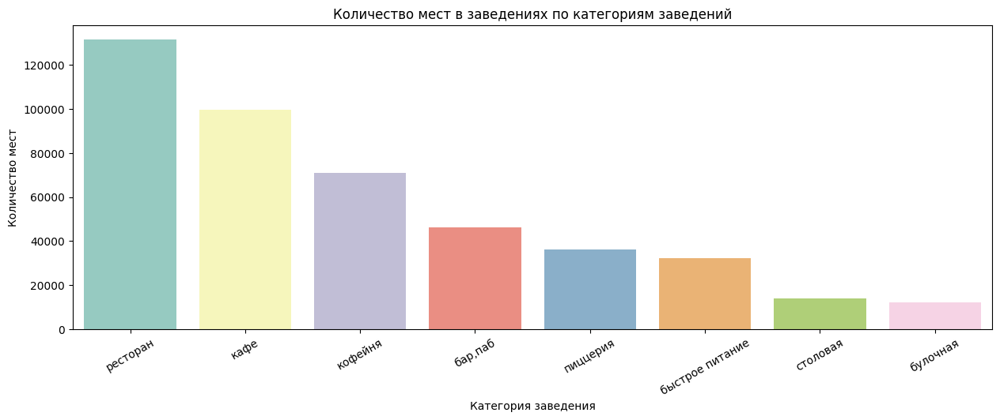

In [21]:
plt.subplots(figsize=(15, 5))
sns.barplot(x='category', y='sum', data=category_places_seats, palette="Set3") 
plt.title('Количество мест в заведениях по категориям заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Количество мест')
plt.xticks(rotation=30)
plt.show()

**Вывод**   
Можно сделать вывод, что по количеству мест в заведениях лидируют рестораны (29.7% от общего числа), кафе (22.5% от общего числа). Наименьшую долю занимают также булочные (2.74%), столовые (3.19%).  
Необходимо также рассмотреть распределение мест по медианному и среднему значениям, чтобы определить среднее количество посадочных мест по категориям заведений, исключив перегибы в одну и другую стороны.

In [22]:
# медианное значение количества посадочных мест
seats_median = moscow_places[moscow_places['seats'] != 0]\
               .groupby('category')['seats']\
               .median()\
               .reset_index()\
               .sort_values(by='seats', ascending=False)
display(seats_median)

,category,seats
6,ресторан,85.0
0,"бар,паб",80.0
4,кофейня,80.0
7,столовая,76.0
2,быстрое питание,70.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


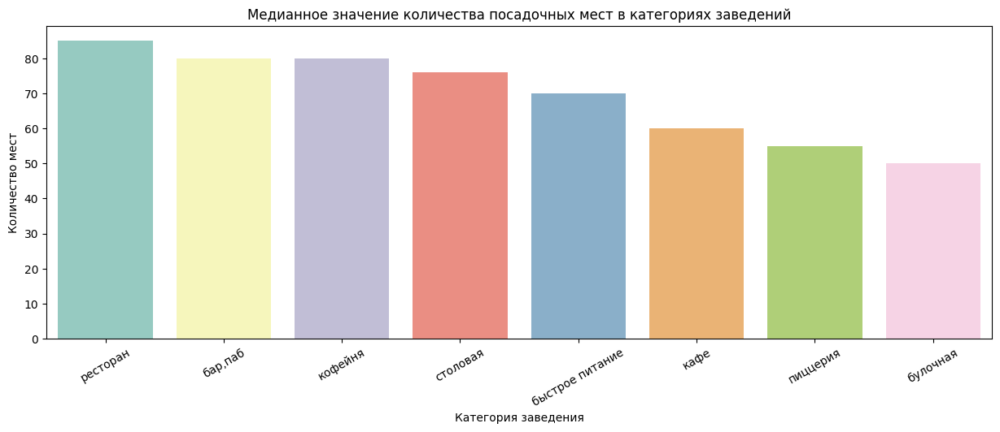

In [23]:
plt.subplots(figsize=(15, 5))
sns.barplot(x='category', y='seats', data=seats_median, palette="Set3") 
plt.title('Медианное значение количества посадочных мест в категориях заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Количество мест')
plt.xticks(rotation=30)
plt.show()

In [24]:
# среднее значение количества посадочных мест
seats_mean = moscow_places[moscow_places['seats'] !=0]\
             .groupby('category')['seats']\
             .mean()\
             .reset_index()\
             .sort_values(by='seats', ascending=False)\
             .round(2)
display(seats_mean)

,category,seats
6,ресторан,108.61
0,"бар,паб",103.57
4,кофейня,100.03
2,быстрое питание,98.08
7,столовая,90.42
1,булочная,89.82
5,пиццерия,88.33
3,кафе,87.31


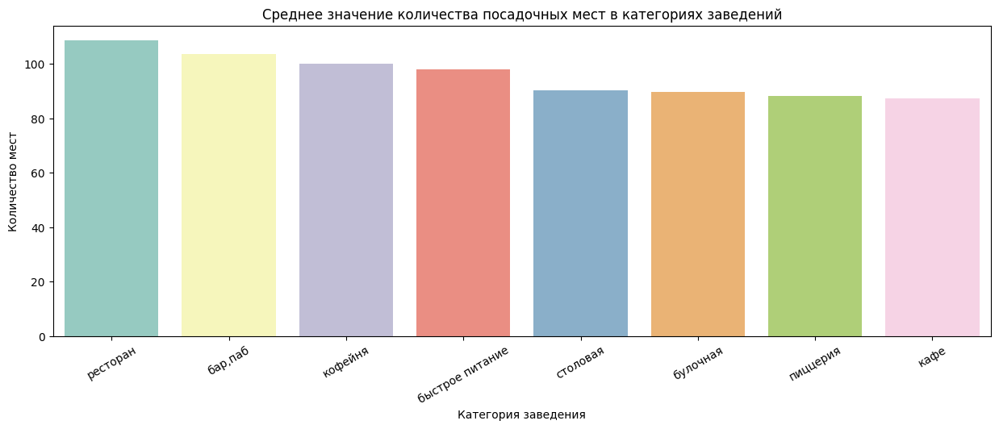

In [25]:
plt.subplots(figsize=(15, 5))
sns.barplot(data = seats_mean, x = 'category', y = 'seats', palette="Set3")
plt.title('Среднее значение количества посадочных мест в категориях заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Количество мест')
plt.xticks(rotation=30)
plt.show()

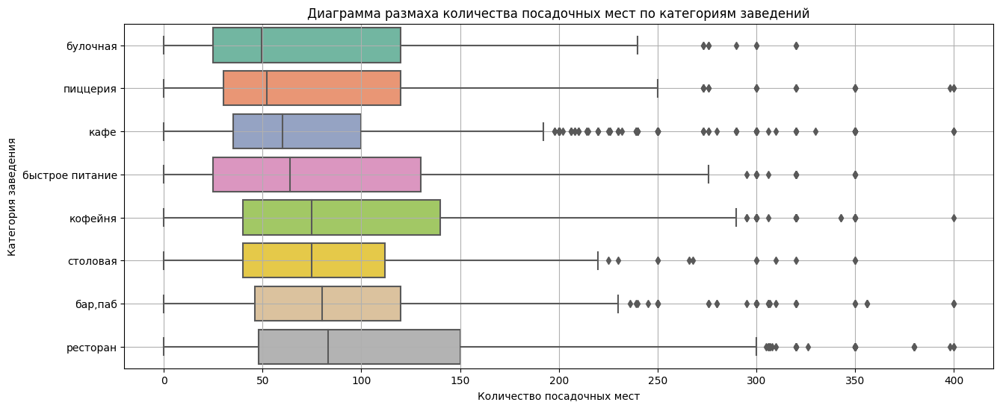

In [26]:
# диаграмма размаха количества посадочных мест по категориям заведений
plt.figure(figsize=(15, 6))
grouped = moscow_places.loc[:,['category', 'seats']] \
    .groupby(['category']) \
    .median() \
    .sort_values(by='seats')
ax = sns.boxplot(data=moscow_places, x='seats', y='category', order=grouped.index, palette="Set2")
plt.title('Диаграмма размаха количества посадочных мест по категориям заведений')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Категория заведения')
plt.grid()
plt.show()

**Вывод**   
Можно сделать вывод, что если рассматривать распределение посадочных мест по категориям заведений по суммарному количеству мест, то лидирующие позиции занимают рестораны и кафе, а протиповоложное положение занимают булочные и столовые.  
Однако если рассматривать медианные и средние значения, то ситуация складывается немного другая.  
При медианном и среднем значениях наибольшее количество посадочных мест приходится на рестораны, бары и пабы, кофейни.  
Наименьшее количество посадочных мест при медианном значении представлено в пиццериях и булочных. А при среднем значении выстраивается такой порядок: булочные, пиццерии и кафе. 

### Соотношение сетевых и несетевых заведений  <a id="set"></a> 

In [27]:
category_places_chain = moscow_places['chain'].value_counts().reset_index()
category_places_chain.columns = ['chain', 'count']
display(category_places_chain)

,chain,count
0,несетевое,5129
1,сетевое,3152


In [28]:
fig = go.Figure(data=[go.Pie(labels=category_places_chain['chain'], values=category_places_chain['count'])], 
          layout=go.Layout(title=go.layout.Title(text="Диаграмма распределения сетевых и несетевых заведений")))
fig.show()

**Вывод**   
Таким образом, наибольшую долю представляют несетевые заведения (61.9%), а наименьшую долю, соответственно, сетевые — 38.1%.

### Анализ сетевых заведений  <a id="set_1"></a> 

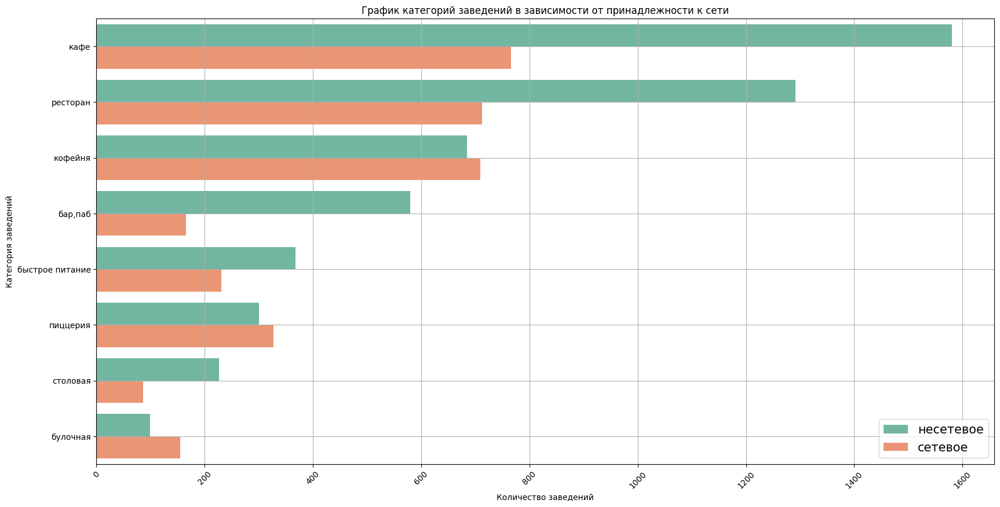

In [29]:
# группируем данные по категории заведения и принадлежности к сети (сетевой/несетевой) и считаем количество
places_chain = moscow_places.groupby(['category', 'chain'], \
                        as_index = False)[['name']].count()
places_chain = places_chain.sort_values(by='name', ascending=False)
plt.figure(figsize=(20, 10))
# строим столбчатый график
sns.barplot(x='name', y='category', data=places_chain, hue='chain', palette="Set2")
plt.title('График категорий заведений в зависимости от принадлежности к сети')
plt.xlabel('Количество заведений')
plt.ylabel('Категория заведений')
plt.xticks(rotation=45)
plt.legend(loc='lower right', fontsize=15)
plt.grid()
plt.show()

**Вывод**   
На основании графика можно сделать вывод, что в таких категориях, как булочная, кофейня и пиццерия наибольшую долю занимают сетевые заведения.

### Топ-15 популярных сетей в Москве  <a id="top_15"></a> 

In [30]:
# срез сетевых заведений
chain_query = moscow_places[moscow_places['chain'] == "сетевое"]

In [31]:
# топ 15 сетевых заведений
top_15 = chain_query.groupby('name').agg({'district' : 'count'})
top_15 = top_15.rename(columns={'district':'count'})
top_15 = top_15.sort_values('count', ascending = False).reset_index().head(15)
top_15

,name,count
0,шоколадница,117
1,домино'с пицца,76
2,додо пицца,73
3,one price coffee,70
4,яндекс лавка,68
5,cofix,65
6,prime,48
7,хинкальная,44
8,кофепорт,42
9,кулинарная лавка братьев караваевых,38


In [32]:
# сетевые заведения и категории заведений
chain_query_category = chain_query.groupby(['name', 'category']).agg({'name' : 'count'})
chain_query_category = chain_query_category.rename(columns={'name' : 'count'})
chain_query_category = chain_query_category.sort_values('count', ascending = False).reset_index()
chain_query_category.head()

,name,category,count
0,шоколадница,кофейня,116
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,73
3,one price coffee,кофейня,70
4,яндекс лавка,ресторан,68


In [33]:
top_15_category = chain_query_category[chain_query_category['name'].isin(top_15['name'])]\
                                                                   .sort_values('count', ascending = False)\
                                                                   .reset_index()
top_15_category.head(15)

,index,name,category,count
0,0,шоколадница,кофейня,116
1,1,домино'с пицца,пиццерия,76
2,2,додо пицца,пиццерия,73
3,3,one price coffee,кофейня,70
4,4,яндекс лавка,ресторан,68
5,5,cofix,кофейня,65
6,6,prime,ресторан,47
7,7,кофепорт,кофейня,42
8,8,кулинарная лавка братьев караваевых,кафе,38
9,9,теремок,ресторан,36


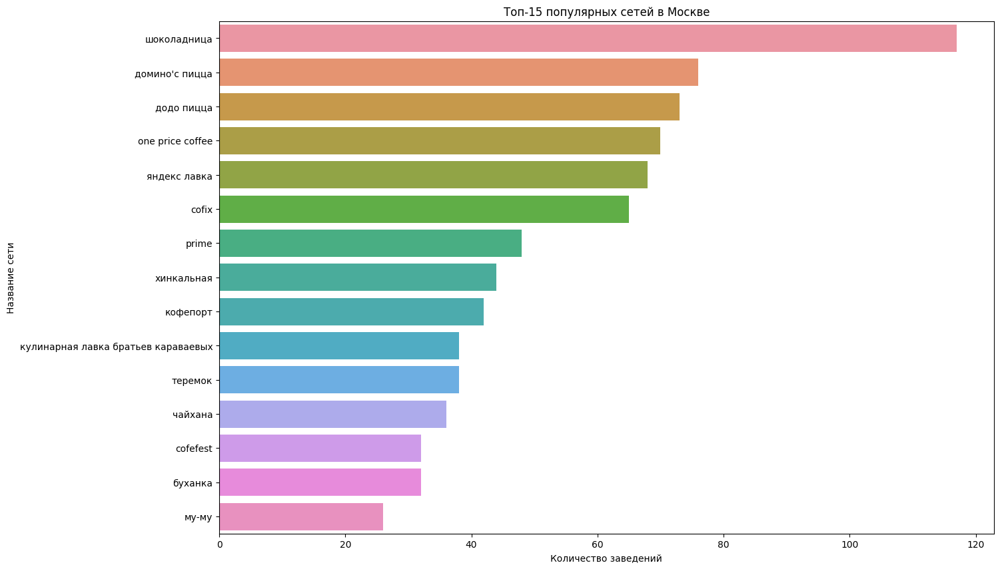

In [34]:
plt.figure(figsize=(15, 10))
# строим столбчатый график
sns.barplot(x='count', y='name', data=top_15)
plt.title('Топ-15 популярных сетей в Москве')
plt.xlabel('Количество заведений')
plt.ylabel('Название сети')
plt.show()

**Вывод**   
Можно сделать вывод, что наиболее популярной сетью является Шоколадница (лидирует с большим отрывом), затем идет Домино'с пицца, Додо пицца, One price cofe, Яндекс лавка и Cofix. Наименее популярным местом является сеть Му-му.   
Данные сети, скорее всего, знакомы каждому — это кофейни, пиццерии, рестораны, кафе.  
Одие из общих параметров данного топа — это то, что заведения данных сетей заведений представлены в нескольких регионах страны.

### Административные районы Москвы <a id="distr"></a>

In [35]:
# административные районы Москвы в датасете
print(f'Количество районов в датасете:', moscow_places['district'].nunique())

Количество районов в датасете: 9


In [36]:
print(f'Виды районов в датасете:', moscow_places['district'].unique())

Виды районов в датасете: ['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


In [37]:
# районы и категории заведений
district_query = moscow_places.groupby(['district', 'category']).agg({'name' : 'count'})
district_query = district_query.rename(columns={'name' : 'count'})
district_query = district_query.sort_values('count', ascending = False).reset_index()
district_query.head()

,district,category,count
0,Центральный административный округ,ресторан,655
1,Центральный административный округ,кафе,455
2,Центральный административный округ,кофейня,423
3,Центральный административный округ,"бар,паб",359
4,Юго-Восточный административный округ,кафе,282


In [38]:
fig = px.bar(district_query, x='count', y='district', color='category')
fig.update_layout(title = 'Количество заведений каждой категории по районам',
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Районы',
                  yaxis={'categoryorder':'total ascending'})
fig.show() 

**Вывод**   
Можно сделать вывод, всего представлено 9 районов.  
Наибольшее количество заведений приходится на центральный административный округ.  
В центральном административном округе больше всего ресторанов, нежели чем в других округах.  
Наименьшее количество кафе представлено в северо-западном административном округе, но, в основном, они имеют равное распределение по всем округам.

### Распределение средних рейтингов по категориям заведений <a id="rating"></a>

In [39]:
category_rating = moscow_places.groupby('category')\
                            .agg({'rating': 'mean'})\
                            .round(2)\
                            .sort_values('rating', ascending=False)\
                            .reset_index()
category_rating

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [40]:
# строим столбчатую диаграмму 
fig = px.bar(category_rating,
             x='rating', 
             y='category',
             text='rating'               
            )
fig.update_layout(title='Средний рейтинг по категориям заведений',
                   xaxis_title='Рейтинг',
                   yaxis_title='Категории заведений')
fig.show() 

**Вывод**  
В целом, у всех заведений усреднённый рейтинг выше 4.  
На основании графика можно сделать вывод, что у категорий бар,паб наивысший рейтинг (4.39). У пиццерий, ресторанов, кофеин и булочных сравнительно схожий рейтинг. Наименьший усреднённый рейтинг у ресторанов быстрого питания (4.05).  

### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района <a id="hor"></a>

In [41]:
rating_df = moscow_places.groupby('district', as_index=False)['rating'].agg('mean').round(2)
rating_df

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.19


In [42]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**Вывод**  
Можно сделать вывод, что самый высокий рейтинг в заведениях в Центральном админинстративном округе - 4.38, а затем уже северный административный округ — 4.24. Самый низкий - в Юго-Восточном административном округе - 4.1.

### Все заведения на карте <a id="map"></a>

In [43]:
# moscow_lat - широта, moscow_lng – долгота
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
mm = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(mm)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
moscow_places.apply(create_clusters, axis=1)

# выводим карту
mm

**Вывод**  
По карте видно, что наибольшее количество заведений расположено в ценре Москвы, однако и в других районах их достаточное количество. Заметно, что на юге и востоке заведений меньшее количество.

### Топ-15 улиц по количеству заведений <a id="top_15_street"></a>

In [44]:
# срез заведений, у которых указана улица
street_query = moscow_places[moscow_places['street'] != "NaN"]
street_query.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,несетевое,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,несетевое,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,несетевое,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,несетевое,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,сетевое,148.0,правобережная улица,False


In [45]:
# топ 15 улиц по количеству заведений
top_15_street = street_query.groupby('street').agg({'name' : 'count'})
top_15_street = top_15_street.rename(columns={'name':'count'})
top_15_street = top_15_street.sort_values('count', ascending = False).reset_index().head(15)
top_15_street

,street,count
0,проспект мира,183
1,профсоюзная улица,122
2,ленинский проспект,101
3,проспект вернадского,97
4,дмитровское шоссе,88
5,каширское шоссе,77
6,варшавское шоссе,76
7,ленинградский проспект,72
8,ленинградское шоссе,70
9,мкад,65


In [46]:
# улицы и категории заведений
street_query_category = street_query.groupby(['street', 'category']).agg({'name' : 'count'})
street_query_category = street_query_category.rename(columns={'name' : 'count'})
street_query_category = street_query_category.sort_values('count', ascending = False).reset_index()
street_query_category.head()

,street,category,count
0,проспект мира,кафе,53
1,проспект мира,ресторан,45
2,мкад,кафе,45
3,проспект мира,кофейня,36
4,профсоюзная улица,кафе,35


In [47]:
streets_top15_category = street_query_category[street_query_category['street'].isin(top_15_street['street'])]\
                                                                              .sort_values('count', ascending = False)\
                                                                              .reset_index()
streets_top15_category.head()

,index,street,category,count
0,0,проспект мира,кафе,53
1,2,мкад,кафе,45
2,1,проспект мира,ресторан,45
3,3,проспект мира,кофейня,36
4,4,профсоюзная улица,кафе,35


In [48]:
fig = px.bar(streets_top15_category, x='count', y='street', color='category')
fig.update_layout(title = 'Количество заведений каждой категории по улицам',
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Улица',
                  yaxis={'categoryorder':'total ascending'})
fig.show() 

**Вывод**  
Можно сделать вывод, что наибольшее количество заведений расположено на проспекте Мира.  
В разрезе всех улиц, можно сказать, что преобладают кафе и рестораны.  
Наименьшее количество заведений расположено на Алтуфьевском шоссе.

### Улицы, на которых находится только один объект общепита <a id="1_street"></a>

In [49]:
one_place = street_query['street'].value_counts().reset_index()
one_place.columns = ['street', 'place_count']
one_place = one_place[one_place['place_count'] == 1]
one_place

,street,place_count
989,новоясеневский тупик,1
990,1-й варшавский проезд,1
991,улица садовники,1
992,проезд одоевского,1
993,пр-т комсомольский,1
...,...,...
1442,улица антонова-овсеенко,1
1443,2-я магистральная улица,1
1444,3-й хорошёвский проезд,1
1445,улица розанова,1


In [50]:
# категории заведений на улицах, где только 1 заведение
street_category_one = street_query_category[street_query_category['street'].isin(one_place['street'])]
street_category_one = street_category_one.groupby('category').agg({'street' : 'count'})
street_category_one = street_category_one.rename(columns={'street' : 'count'})
street_category_one = street_category_one.sort_values('count', ascending = False).reset_index()
street_category_one

,category,count
0,кафе,159
1,ресторан,93
2,кофейня,85
3,"бар,паб",39
4,столовая,36
5,быстрое питание,23
6,пиццерия,15
7,булочная,8


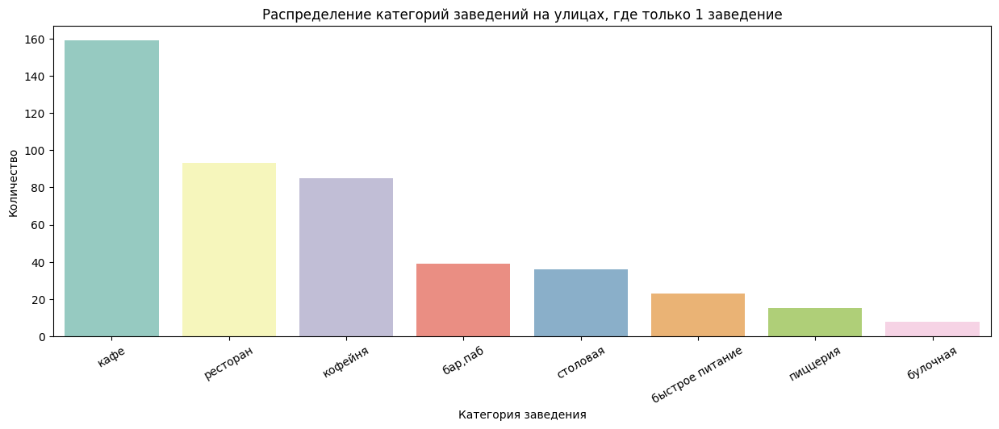

In [51]:
plt.subplots(figsize=(15, 5))
sns.barplot(x='category', y='count', data=street_category_one, palette="Set3") 
plt.title('Распределение категорий заведений на улицах, где только 1 заведение')
plt.xlabel('Категория заведения')
plt.ylabel('Количество')
plt.xticks(rotation=30)
plt.show()

In [52]:
# районы и улицы заведений
district_query_street = moscow_places.groupby(['district', 'street']).agg({'name' : 'count'})
district_query_street = district_query_street.rename(columns={'name' : 'count'})
district_query_street = district_query_street.sort_values('count', ascending = False).reset_index()
district_query_street.head()

,district,street,count
0,Северо-Восточный административный округ,проспект мира,131
1,Юго-Западный административный округ,профсоюзная улица,122
2,Западный административный округ,проспект вернадского,84
3,Южный административный округ,каширское шоссе,77
4,Южный административный округ,варшавское шоссе,76


In [53]:
# районы улиц, где только 1 заведение
street_district_one = district_query_street[district_query_street['street'].isin(one_place['street'])]
street_district_one = street_district_one.groupby('district').agg({'street' : 'count'})
street_district_one = street_district_one.rename(columns={'street' : 'count'})
street_district_one = street_district_one.sort_values('count', ascending = False).reset_index()
street_district_one

,district,count
0,Центральный административный округ,145
1,Северо-Восточный административный округ,55
2,Восточный административный округ,52
3,Северный административный округ,51
4,Южный административный округ,43
5,Юго-Восточный административный округ,40
6,Западный административный округ,35
7,Северо-Западный административный округ,19
8,Юго-Западный административный округ,18


In [54]:
fig = px.bar(street_district_one,
             x='count', 
             y='district',
             text='count'               
            )
fig.update_layout(title='Распределения районов, где на улице только 1 заведение',
                   xaxis_title='Количество улиц, где 1 заведение',
                   yaxis_title='Район')
fig.show()

In [55]:
# районы и улицы заведений
rating_query_street = moscow_places.groupby(['rating', 'street']).agg({'name' : 'count'})
district_query_street = district_query_street.rename(columns={'name' : 'count'})
district_query_street = district_query_street.sort_values('count', ascending = False).reset_index()
district_query_street.head()

,index,district,street,count
0,0,Северо-Восточный административный округ,проспект мира,131
1,1,Юго-Западный административный округ,профсоюзная улица,122
2,2,Западный административный округ,проспект вернадского,84
3,3,Южный административный округ,каширское шоссе,77
4,4,Южный административный округ,варшавское шоссе,76


In [56]:
# рейтинг и улицы заведений
rating_street = moscow_places.groupby('street', as_index=False)['rating'].agg('mean')
rating_street

,street,rating
0,1-й автозаводский проезд,4.200000
1,1-й балтийский переулок,4.400000
2,1-й варшавский проезд,4.000000
3,1-й вешняковский проезд,3.400000
4,1-й волоколамский проезд,4.166667
...,...,...
1442,ясеневая улица,4.358333
1443,ясногорская улица,2.950000
1444,яузская улица,4.342857
1445,яузский бульвар,4.450000


In [57]:
# рейтинг заведений, которые распологаются по одному на улице
street_rating_one = rating_street[rating_street['street'].isin(one_place['street'])]
street_rating_one = street_rating_one.groupby('rating').agg({'street' : 'count'})
street_rating_one = street_rating_one.rename(columns={'street' : 'count'})
street_rating_one = street_rating_one.sort_values('count', ascending = False).reset_index()
street_rating_one.head()

,rating,count
0,4.3,84
1,4.4,56
2,4.2,54
3,4.1,50
4,4.7,28


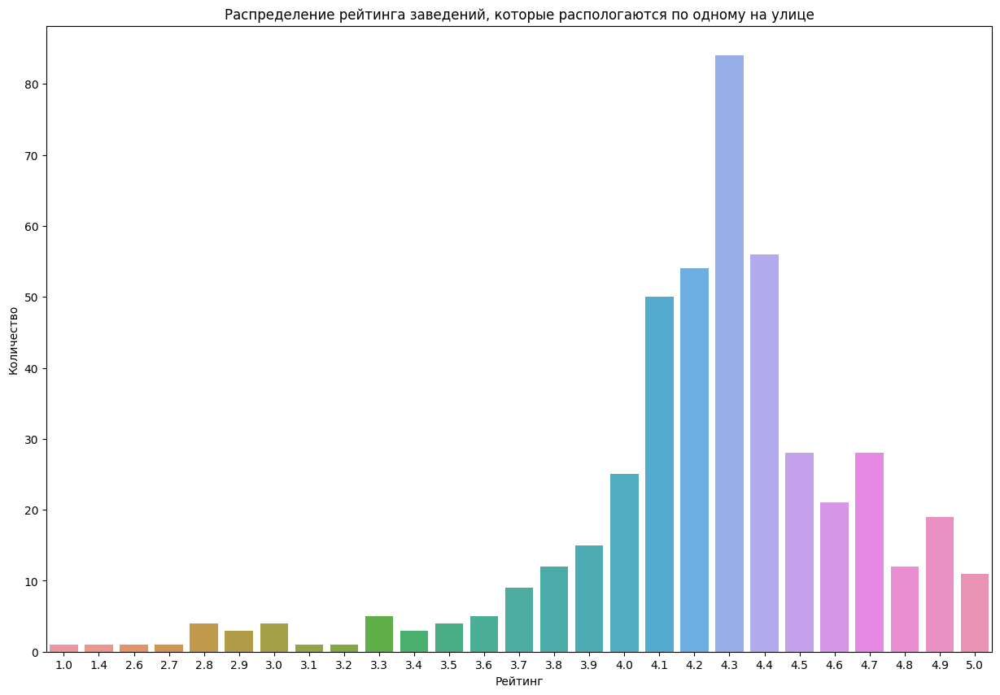

In [58]:
plt.figure(figsize=(15, 10))
# строим столбчатый график
sns.barplot(x='rating', y='count', data=street_rating_one)
plt.title('Распределение рейтинга заведений, которые распологаются по одному на улице')
plt.xlabel('Рейтинг')
plt.ylabel('Количество')
plt.show()

**Вывод**  
На 458 улицах расположено по одному заведению.  
Большую часть из них составляет категория "кафе", а наименьшую — булочная.  
Большинство заведений расположено в центральном административном округе, а наименьшее количество заведений, которые располагаются по одному на улице, находятся в юго-западном административном округе.  
Большую часть заведений составляют заведения с рейтингом 4.3, на втором и третьем местах рейтинг заведений составляет 4.4 и 4.2 соответственно. А наименьшую долю составляют заведения с рейтингом — 1.

### Фоновая картограмма (хороплет) со средними чеками заведений <a id="avg"></a>

In [59]:
median_bills = moscow_places.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
median_bills

,district,middle_avg_bill
0,Восточный административный округ,550.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [60]:
mmm = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_bills,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='GnBu',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(mmm)

# выводим карту
mmm

**Вывод**  
Можно сделать вывод, что самый высокий средний чек в Центральном и Западном административных округах. Самый маленький чек в Юго-Восточном административном округе. Таким образом, чем дальше заведение от центра, тем ниже средний чек в заведении.

### Вывод <a id="done_1"></a>

Таким образом, можно сделать следующие выводы:  
* наибольшую долю заведений по Москве составляют кафе и рестораны, а наименьшую — булочные.  
* по количеству посадочных мест схожая ситуация:  
	1. по количеству посадочных мест лидируют рестораны и кафе, а наименьшее количество у булочных и столовых.  
	2. по медианному и среднему значениям лидируют рестораны, бары и пабы, кофейни. Наименьшее количество посадочных мест приходится на булочные, пиццерии и кафе.  
* большинство заведений в Москве представлено несетевыми заведениями (61.9%), на сетевые заведения приходится — 38.1%.  
* наибольшую долю среди сетевых заведений занимают Шоколадница (с большим отрывом), Домино'с пицца, Додо пицца, One price cofe, Яндекс лавка и Cofix.  
* наименьшую долю среди сетевых заведений занимает Му-му.  
* всего в исследовании представлено 9 районов Москвы:  
	1. наибольшее количество заведений приходится на центральный административный округ.   
	2. в центральном административном округе большое количество ресторанов, наибольший показатель среди всех районов.  
	3. распределение кафе по районам Москвы примерно равное.  
* у большей части заведений усреднённый рейтинг выше 4, однако:  
	1. у категорий бар,паб наивысший рейтинг (4.39).  
	2. у пиццерий, ресторанов, кофеин и булочных сравнительно равный рейтинг.  
	3. наименьший рейтинг у ресторанов быстрого питания (4.05).
	4. самый высокий рейтинг в заведениях в центральном (4.38) и северном (4.24) административных округах.  
	5. самый низкий рейтинг в юго-восточном административном округе (4.1).  
* наибольшее количество заведений расположено в ценре Москвы, но и в других районах их достаточное количество (на юге и востоке заведений меньшее количество).  
* на основе 15 наиболее популярных заведений:  
	1. наибольшее количество заведений расположено на проспекте Мира.  
	2. наименьшее количество заведений расположено на Алтуфьевском шоссе.  
* на основе анализа заведений, которые расположены по 1 на улице:  
	1. на 458 улицах расположено по одному заведению.  
	2. большая часть "кафе", а наименьшая — булочная.  
	3. большинство заведений расположено в центральном административном округе, наименьшее — в юго-западном административном округе. 
	4. большая часть заведений с рейтингом 4.3, 4.4, 4.2.  
	5. наименьшая часть заведений с рейтингом 1.  
* чем дальше от центра Москвы находится заведение, тем ниже средний чек заведения.  

## Исследование по открытию кофейни <a id="coffe"></a>

In [61]:
coffee_query = moscow_places[moscow_places['category'] == 'кофейня']
print('Количество заведений категории кофейня:', len(coffee_query))

Количество заведений категории кофейня: 1394


In [62]:
coffee_count_district = coffee_query.groupby('district')['name'].count().sort_values(ascending = False).reset_index()
coffee_count_district.columns = ['district', 'count']
display(coffee_count_district)

,district,count
0,Центральный административный округ,423
1,Северный административный округ,186
2,Северо-Восточный административный округ,159
3,Западный административный округ,146
4,Южный административный округ,130
5,Восточный административный округ,104
6,Юго-Западный административный округ,95
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


In [63]:
# строим столбчатую диаграмму 
fig = px.bar(coffee_count_district,
             x='count', 
             y='district',
             text='count'               
            )
fig.update_layout(title='Количество кофеен по районам',
                   xaxis_title='Количество кофеен',
                   yaxis_title='Район')
fig.show() 

In [64]:
# создаём карту Москвы
mmmm = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(mmmm)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters_caffe(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters_caffe() к каждой строке датафрейма
coffee_query.apply(create_clusters_caffe, axis=1)

# выводим карту
mmmm

**Вывод**  
Количество кофеен в датасете — 1394.  
Большая часть кофеен располагается в Центральном административном округе (423). Меньше всего заведений расположено в юго-восточном (89) и северо-западном (62) административных округах. 

### Круглосуточные кофейни <a id="24_7"></a>

In [65]:
coffee_is_24_7 = coffee_query[coffee_query['is_24/7'] == True]
print('Количество круглосуточных кофеен:', len(coffee_is_24_7))

coffee_not_is_24_7 = coffee_query[coffee_query['is_24/7'] == False]
print('Количество кофеен не работающих круглосуточно:', len(coffee_not_is_24_7))

Количество круглосуточных кофеен: 59
Количество кофеен не работающих круглосуточно: 1320


In [66]:
# создаём карту Москвы
m_24 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m_24)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters_caffe(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters_caffe() к каждой строке датафрейма
coffee_is_24_7.apply(create_clusters_caffe, axis=1)

# выводим карту
m_24

**Вывод**  
Количество круглосуточных кофеен — 59. Количество кофеен не работающих круглосуточно значительно превышает количество круглосуточных кофеен и составляет 1320 заведений.  
По карте видно, что большинство круглосуточных кофеен находится в центре Москвы.

### Рейтинги кофеен <a id="rat"></a>

In [67]:
coffee_rating = coffee_query.groupby('district', as_index=False)['rating'].agg('mean').round(2).sort_values('rating', ascending=False)
coffee_rating

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
7,Юго-Западный административный округ,4.29
0,Восточный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.19


In [68]:
# строим столбчатую диаграмму 
fig = px.bar(coffee_rating,
             x='rating', 
             y='district',
             text='rating'               
            )
fig.update_layout(title='Рейтинг кофеен по районам',
                   xaxis_title='Рейтинг',
                   yaxis_title='Район')
fig.show() 

In [69]:
# создаём карту Москвы
m_d = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m_d)

# выводим карту
m_d

**Вывод**  
Самый высокий рейтинг кофеен центральном, северо-западном, северном и юго-западном административных округах. Самый низкий рейтинг кофеен у западного административного округа.

### Стоимость чашки капучино  <a id="cup"></a>

In [70]:
cup_of_coffee = coffee_query.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean').round(2).sort_values('middle_coffee_cup', ascending=False)
display(cup_of_coffee)

,district,middle_coffee_cup
1,Западный административный округ,188.56
5,Центральный административный округ,188.00
7,Юго-Западный административный округ,184.18
0,Восточный административный округ,174.02
2,Северный административный округ,166.34
4,Северо-Западный административный округ,165.52
3,Северо-Восточный административный округ,165.33
8,Южный административный округ,158.49
6,Юго-Восточный административный округ,151.09


In [71]:
coffee_price = round(cup_of_coffee['middle_coffee_cup'].mean(), 2)
print(f'Средняя стоимость чашки капучино:', coffee_price)

Средняя стоимость чашки капучино: 171.28


In [72]:
# строим столбчатую диаграмму 
fig = px.bar(cup_of_coffee,
             x='middle_coffee_cup', 
             y='district',
             text='middle_coffee_cup'               
            )
fig.update_layout(title='Распределение цен чашки капучино по районам',
                   xaxis_title='Цена чашки капучино',
                   yaxis_title='Район')
fig.show() 

In [73]:
m_cup = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cup_of_coffee,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    legend_name='Средняя цена чашки капучино по районам',
).add_to(m_cup)

# выводим карту
m_cup

**Вывод**   
Самая высокая стоимость чашки капучино в западном и центральном, юго-западном административных округах. 
Средняя стоимость чашки капучино составляет 171.28.

### Рекомендации по открытию кофейни  <a id="rec"></a>

Рекомендации:  
* поскольку в центре и северо-западном административных округах самое большое количество кофеен, следовательно, там высокий спрос на кофе (скорее всего, формата coffe to go), лучше присмотреться к открытию заведений в данных районах.  
* открывать круглосуточную кофейню на окраине не имеет смысла, поскольку круглосуточно работает малое количество кофеен (в центре), однако, в центре, также лучше не открывать круглосуточные кофейни, поскольку с количеством затрат на ночное ведение бизнеса, очень тяжело и долго нужно будет ждать окупаемости кофейни.  
* самый высокий рейтинг кофеен центральном, северо-западном, северном и юго-западном административных округах, следовательно  потребители в данных районах могут быть более лояльными. Самый низкий рейтинг кофеен у западного административного округа - данный район не является перспективным для открытия кофейни. Однако, можно попробовать открыть небольшую кофейню формата coffe to go, чтобы оценить лояльность потребителей к кофейням, возможно дело именно в заведениях, которые представлены в данном районе, а не в лояльности потребителей.  
* стоимость чашки капучино следует устанавливать на уровне от 160-175 руб, поскольку средняя цена на чашку составляет 171.28 руб.

## Презентация <a id="prez"></a> 

Презентация: <https://disk.yandex.ru/i/XdMWHCv0n5zjkg> 

## Общий вывод <a id="done"></a> 

При проведении исследования были выполнены поставленные задачи:

* обработаны и подготовлены данные для проведения анализа.
* проанализировано распределение заведений по различным критериям.
* детализировано исследование: открытие кофейни.  
* даны рекомендации для открытия кофейни.   
* подготовлена презентация.   
* на протяжении работы были сформулированы выводы.   
  
* при выполнении предобработки данных для проведения исследования были обработаны дубликаты и выбросы, добавлены новые столбцы с наименованием улиц и времени работы заведения (ежедневно/круглосуточно).  
* в датасете представлены такие категории заведений, как: ресторан, кафе, кофейня, бар, паб, пиццерия, ресторан быстрого питания, столовая, булочная.  
* наиболее распространены такие заведения, как кафе и рестораны.  
* наименее востребованы — булочные.  
* наибольшее число посадочных мест в ресторанах и кафе, барах и пабах, кофейни, что логично, поскольку в данные заведения люди приходят провести вечер, например.  
* наибольшую долю занимают несетевые заведения.  
* среди сетевых заведений наибольшее распространение получили: Шоколадница (с большим отрывом), Домино'с пицца, Додо пицца, One price cofe, Яндекс лавка и Cofix.  
* в датасете представлено 9 административных округов, среди которых наибольшее количество заведений приходится на центральный административный округ (наиболее распространены рестораны).  
* во всех районах большое распространение получили кафе (примерно, в равной степени). 
* самый высокий рейтинг заведений в центральном и северном админинстративных округах.
* среди категорий заведений наивысший рейтинг приходится на бары и пабы.  
* наибольшее количество заведений расположено на проспекте Мира.  
* есть 458 улиц, на которых расположено по 1 заведению и большая их часть — это кафе в центральном административном округе.  
* при приближении к центру Москвы средний чек заведения увеличивается.  
  
*  рекомендации при открытии кофейни: 
    1. открытие в центре и северо-западном административных округах.  
    2. открывать круглосуточную кофейню не имеет смысла.  
    3. потребители могут быть более лояльными в центральном, северо-западном, северном и юго-западном административных округах (поскольку в данных районах наилучшие показатели рейтинга кофеен).  
    4. можно попробовать открыть небольшую кофейню формата coffe to go в западном административном округе, чтобы оценить лояльность покупателей (поскольку в данном районе самые низкие рейтинги, хорошая кофейня может привлечь покупателей).  
    5. стоимость чашки кофе при открытии следует устанавливать на уровне от 160-175 руб. (средняя цена чашки по Москве 171.28 руб.)